In [59]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
geolist=gpd.read_file("estios/uk/data/cities_towns.geojson")
import numpy as np
import matplotlib.colors as mcolors
import math
from matplotlib.patches import Rectangle

FlowMapData=pd.read_csv("FlowMapData.csv",encoding='utf8')
geolist['NAME1']=np.where(geolist['NAME1'] == "Newcastle upon Tyne","Newcastle",geolist['NAME1'])
geolist['NAME1']=np.where(geolist['NAME1'] == "Kingston upon Hull","Hull",geolist['NAME1'])
geolist_IO=geolist[geolist["NAME1"].isin(list(FlowMapData["City"].unique()))]

boundary=gpd.read_file("estios/uk/data/boundary/CTRY_DEC_2022_GB_BFC.shp")

In [49]:
FlowMapData

,Unnamed: 0,index,City,Other_City,Sector,P_i^m,Distance,c_{ij})^-β,Q_i^m,A_i^m,B_j^m,init_b_ij^m,sum_j b_ij^m,K,b_ij^m,y_ij^m
0,0,0,Barnsley,Bristol,Agriculture,738279.0,245.655622,0.000017,23.126825,7.476196e-45,1.508345e+44,319.054274,738279.0,0.000001,0.000432,39.368712
1,1,1,Barnsley,Bristol,Production,738279.0,245.655622,0.000017,3379.376685,2.129867e-29,1.507862e+27,1327.755052,738279.0,0.000001,0.001798,296460.769561
2,2,2,Barnsley,Bristol,Construction,738279.0,245.655622,0.000017,1662.244916,2.145780e-31,2.370314e+29,1034.315682,738279.0,0.000001,0.001401,1989.719209
3,3,3,Barnsley,Bristol,"Distribution, transport, hotels and restaurants",738279.0,245.655622,0.000017,7664.965602,1.306954e-23,6.481316e+20,794.329687,738279.0,0.000001,0.001076,103286.827241
4,4,4,Barnsley,Bristol,Information and communication,738279.0,245.655622,0.000017,312.885986,3.901782e-30,9.753494e+27,145.672115,738279.0,0.000001,0.000197,7056.277114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21615,21615,22075,York,Worthing,Financial and insurance,109632.0,353.505924,0.000008,3104.976633,7.260122e-20,1.847218e+17,36.531234,109632.0,0.000009,0.000333,9653.533706
21616,21616,22076,York,Worthing,Real estate,109632.0,353.505924,0.000008,1386.423004,1.255585e-24,3.197613e+22,48.832793,109632.0,0.000009,0.000445,214.747404
21617,21617,22077,York,Worthing,Professional and support activities,109632.0,353.505924,0.000008,11144.818328,4.757387e-14,7.386712e+10,34.358686,109632.0,0.000009,0.000313,9195.903087
21618,21618,22078,York,Worthing,"Government, health & education",109632.0,353.505924,0.000008,25225.026228,8.800591e-14,3.754857e+10,73.127520,109632.0,0.000009,0.000667,2147.692951


In [60]:
Flowmatrix=pd.pivot(index="City",columns="Other_City",values="y_ij^m",data=FlowMapData.query("Sector=='Financial and insurance'")).fillna(0)

In [117]:
Flowmatrix-Flowmatrix.T

Other_City,Barnsley,Basildon,Birmingham,Blackpool,Bradford,Bristol,Burnley,Cambridge,Chatham,Coventry,...,Slough,Southampton,Sunderland,Swindon,Telford,Wakefield,Warrington,Wigan,Worthing,York
City,,,,,,,,,,,,,,,,,,,,,
Barnsley,0.000000e+00,-6.013971e+03,-7.044925e+05,-5.357230e+04,-1.610593e+06,-2.701357e+05,-1.216048e+04,-2.529378e+04,-2.686878e+03,-1.078557e+05,...,-1.423285e+03,-2.690264e+04,-5.551852e+04,-1.443220e+05,-5.414976e+04,-8.832026e+05,-6.164474e+04,2.387699e+04,-7.727885e+03,-8.661839e+05
Basildon,6.013971e+03,0.000000e+00,1.841006e+05,9.010422e+03,1.926866e+03,2.924886e+03,5.189782e+03,8.906165e+02,2.799505e+05,1.390569e+04,...,4.912621e+03,2.382067e+04,6.904792e+03,-4.158631e+04,9.731337e+03,3.563202e+03,4.436149e+03,7.791215e+03,9.347558e+02,3.552240e+03
Birmingham,7.044925e+05,-1.841006e+05,0.000000e+00,6.447309e+05,-1.095670e+06,-1.773190e+07,5.726468e+05,-7.254177e+05,-1.989420e+03,-2.488684e+07,...,-3.201884e+04,-7.915443e+05,9.567980e+04,-1.407083e+07,9.129067e+05,2.033594e+05,3.202803e+05,1.309052e+06,-2.769794e+05,-1.078417e+06
Blackpool,5.357230e+04,-9.010422e+03,-6.447309e+05,0.000000e+00,-5.723455e+05,-6.231469e+05,2.330156e+05,-2.995915e+04,-2.710118e+03,-1.171520e+05,...,-1.832580e+03,-4.646751e+04,-6.590834e+04,-2.961057e+05,-6.565243e+04,-8.925769e+03,-1.154300e+05,8.735436e+05,-1.406795e+04,-3.531441e+05
Bradford,1.610593e+06,-1.926866e+03,1.095670e+06,5.723455e+05,0.000000e+00,-8.541310e+04,1.927620e+06,-7.016114e+03,4.630450e+03,3.481099e+04,...,1.078373e+03,1.211407e+04,2.428853e+05,-1.145379e+05,1.082900e+05,2.332937e+06,2.758362e+05,7.399006e+05,-2.264405e+03,1.010690e+05
Bristol,2.701357e+05,-2.924886e+03,1.773190e+07,6.231469e+05,8.541310e+04,0.000000e+00,2.951503e+05,-2.033334e+03,1.088198e+05,8.705138e+05,...,5.371363e+04,1.966891e+06,2.788226e+05,-1.300959e+07,1.161782e+06,1.578240e+05,3.265878e+05,5.447766e+05,4.975442e+03,1.258461e+05
Burnley,1.216048e+04,-5.189782e+03,-5.726468e+05,-2.330156e+05,-1.927620e+06,-2.951503e+05,0.000000e+00,-1.893435e+04,-2.267499e+03,-8.165284e+04,...,-1.232240e+03,-2.663844e+04,-7.776693e+04,-1.429948e+05,-5.572904e+04,-7.976568e+04,-1.607969e+05,1.752132e+05,-7.464101e+03,-4.700100e+05
Cambridge,2.529378e+04,-8.906165e+02,7.254177e+05,2.995915e+04,7.016114e+03,2.033334e+03,1.893435e+04,0.000000e+00,3.007858e+04,6.166524e+04,...,6.645289e+03,3.518930e+04,2.278956e+04,-1.017262e+05,3.455626e+04,1.446086e+04,1.584804e+04,2.766920e+04,4.683662e+02,1.345769e+04
Chatham,2.686878e+03,-2.799505e+05,1.989420e+03,2.710118e+03,-4.630450e+03,-1.088198e+05,2.267499e+03,-3.007858e+04,0.000000e+00,-1.129472e+04,...,-1.868764e+03,-2.235209e+04,8.693127e+02,-1.074184e+05,6.210454e+02,8.942490e+02,8.443222e+02,4.023700e+03,-2.996139e+04,-6.526126e+03


In [110]:
net_matrix=pd.DataFrame(data=np.tril((Flowmatrix-Flowmatrix.T).values,k=0),index=Flowmatrix.index,columns=Flowmatrix.columns)

In [118]:
net_matrix_new=net_matrix.reset_index(inplace=False)
net_matrix_new=net_matrix_new.melt(id_vars=["City"],value_name="flow")
net_matrix_new=net_matrix_new[net_matrix_new["flow"]!=0]

In [119]:
net_matrix_new

,City,Other_City,flow
1,Basildon,Barnsley,6.013971e+03
2,Birmingham,Barnsley,7.044925e+05
3,Blackpool,Barnsley,5.357230e+04
4,Bradford,Barnsley,1.610593e+06
5,Bristol,Barnsley,2.701357e+05
...,...,...,...
2066,Worthing,Warrington,6.706702e+03
2067,York,Warrington,1.416320e+05
2113,Worthing,Wigan,1.189304e+04
2114,York,Wigan,3.523900e+05


In [63]:
Flowmatrix.T

City,Barnsley,Basildon,Birmingham,Blackpool,Bradford,Bristol,Burnley,Cambridge,Chatham,Coventry,...,Slough,Southampton,Sunderland,Swindon,Telford,Wakefield,Warrington,Wigan,Worthing,York
Other_City,,,,,,,,,,,,,,,,,,,,,
Barnsley,0.000000e+00,6.537188e+03,9.424542e+05,9.488024e+04,1.813364e+06,2.945074e+05,7.374561e+04,2.755151e+04,3.578022e+03,1.263616e+05,...,1.734538e+03,3.167807e+04,7.892173e+04,1.488306e+05,7.426170e+04,1.449190e+06,9.272622e+04,2.339739e+04,8.439442e+03,9.833614e+05
Basildon,5.232170e+02,0.000000e+00,8.544204e+04,2.029558e+03,4.852296e+03,8.615384e+04,5.501175e+02,3.734470e+04,1.325639e+05,1.675769e+04,...,3.955346e+03,2.696205e+04,2.552604e+03,6.691252e+04,4.082365e+03,9.184290e+02,1.391508e+03,3.213594e+02,1.749506e+04,7.267070e+03
Birmingham,2.379617e+05,2.695427e+05,0.000000e+00,8.901527e+05,1.966620e+06,2.637697e+07,2.481733e+05,1.073975e+06,1.464008e+05,5.925853e+07,...,1.106753e+05,1.964349e+06,5.484857e+05,1.598921e+07,1.257254e+07,3.719073e+05,9.777928e+05,1.869475e+05,4.158385e+05,2.042214e+06
Blackpool,4.130793e+04,1.103998e+04,1.534884e+06,0.000000e+00,7.701506e+05,7.693915e+05,2.537888e+05,3.690556e+04,6.333046e+03,1.765367e+05,...,3.117515e+03,7.107896e+04,2.066845e+05,3.182501e+05,1.737106e+05,8.671209e+04,5.016789e+05,2.399262e+05,1.744666e+04,4.862229e+05
Bradford,2.027703e+05,6.779161e+03,8.709500e+05,1.978051e+05,0.000000e+00,3.285958e+05,2.980116e+05,2.626149e+04,3.772773e+03,1.123964e+05,...,1.783134e+03,3.479675e+04,1.470327e+05,1.570983e+05,7.615466e+04,9.359062e+05,1.380810e+05,4.334711e+04,9.205257e+03,1.539689e+06
Bristol,2.437173e+04,8.907873e+04,8.645066e+06,1.462446e+05,2.431827e+05,0.000000e+00,3.246494e+04,2.081336e+05,5.414889e+04,1.130937e+06,...,4.597179e+04,2.393847e+06,1.079308e+05,2.052211e+07,5.112026e+05,4.243211e+04,1.070603e+05,2.326549e+04,2.640823e+05,2.860605e+05
Burnley,6.158513e+04,5.739900e+03,8.208202e+05,4.868044e+05,2.225632e+06,3.276152e+05,0.000000e+00,2.099447e+04,3.231158e+03,9.901763e+04,...,1.569487e+03,3.250633e+04,1.205858e+05,1.483772e+05,8.247623e+04,1.498432e+05,2.686141e+05,1.234363e+05,8.302317e+03,5.482377e+05
Cambridge,2.257730e+03,3.823532e+04,3.485570e+05,6.946414e+03,1.924537e+04,2.061002e+05,2.060116e+03,0.000000e+00,1.474923e+04,7.833612e+04,...,5.585229e+03,4.191116e+04,8.702628e+03,1.613885e+05,1.499231e+04,3.839839e+03,5.128046e+03,1.169622e+03,1.621086e+04,2.963372e+04
Chatham,8.911437e+02,4.125144e+05,1.444114e+05,3.622928e+03,8.403223e+03,1.629687e+05,9.636587e+02,4.482780e+04,0.000000e+00,2.741569e+04,...,6.685766e+03,5.662627e+04,4.560382e+03,1.222932e+05,7.106798e+03,1.574077e+03,2.441346e+03,5.657238e+02,4.529487e+04,1.251267e+04


In [11]:
vis_list=FlowMapData.loc[:,["City","Other_City","Sector","Q_i^m","P_i^m","y_ij^m"]]
Citypoint_list=geolist_IO.set_index("NAME1").geometry
vis_list=vis_list.join(Citypoint_list,on="City").rename(columns={"geometry":"Orig_point"})
vis_list=vis_list.join(Citypoint_list,on="Other_City").rename(columns={"geometry":"Dest_point"})
vis_list

,City,Other_City,Sector,Q_i^m,P_i^m,y_ij^m,Orig_point,Dest_point
0,Barnsley,Bristol,Agriculture,23.126825,738279.0,39.368712,POINT (434376.000 406446.000),POINT (358337.000 172855.000)
1,Barnsley,Bristol,Production,3379.376685,738279.0,296460.769561,POINT (434376.000 406446.000),POINT (358337.000 172855.000)
2,Barnsley,Bristol,Construction,1662.244916,738279.0,1989.719209,POINT (434376.000 406446.000),POINT (358337.000 172855.000)
3,Barnsley,Bristol,"Distribution, transport, hotels and restaurants",7664.965602,738279.0,103286.827241,POINT (434376.000 406446.000),POINT (358337.000 172855.000)
4,Barnsley,Bristol,Information and communication,312.885986,738279.0,7056.277114,POINT (434376.000 406446.000),POINT (358337.000 172855.000)
...,...,...,...,...,...,...,...,...
21615,York,Worthing,Financial and insurance,3104.976633,109632.0,9653.533706,POINT (460218.000 452158.000),POINT (514843.000 102898.000)
21616,York,Worthing,Real estate,1386.423004,109632.0,214.747404,POINT (460218.000 452158.000),POINT (514843.000 102898.000)
21617,York,Worthing,Professional and support activities,11144.818328,109632.0,9195.903087,POINT (460218.000 452158.000),POINT (514843.000 102898.000)
21618,York,Worthing,"Government, health & education",25225.026228,109632.0,2147.692951,POINT (460218.000 452158.000),POINT (514843.000 102898.000)


In [12]:
from shapely.geometry import Point, LineString
vis_list["Line"]=vis_list.apply(lambda row: LineString([row.Orig_point,row.Dest_point]),axis=1)
vis_list_line=gpd.GeoDataFrame(vis_list,geometry="Line",crs=geolist_IO.crs)
vis_list_line["yij_pp"]=vis_list_line["y_ij^m"]/vis_list_line["P_i^m"]
vis_list_line["yij_pe"]=vis_list_line["y_ij^m"]/vis_list_line["Q_i^m"]


In [13]:
vis_list

,City,Other_City,Sector,Q_i^m,P_i^m,y_ij^m,Orig_point,Dest_point,Line,yij_pp,yij_pe
0,Barnsley,Bristol,Agriculture,23.126825,738279.0,39.368712,POINT (434376.000 406446.000),POINT (358337.000 172855.000),"LINESTRING (434376.000 406446.000, 358337.000 ...",0.000053,1.702296
1,Barnsley,Bristol,Production,3379.376685,738279.0,296460.769561,POINT (434376.000 406446.000),POINT (358337.000 172855.000),"LINESTRING (434376.000 406446.000, 358337.000 ...",0.401557,87.726465
2,Barnsley,Bristol,Construction,1662.244916,738279.0,1989.719209,POINT (434376.000 406446.000),POINT (358337.000 172855.000),"LINESTRING (434376.000 406446.000, 358337.000 ...",0.002695,1.197007
3,Barnsley,Bristol,"Distribution, transport, hotels and restaurants",7664.965602,738279.0,103286.827241,POINT (434376.000 406446.000),POINT (358337.000 172855.000),"LINESTRING (434376.000 406446.000, 358337.000 ...",0.139902,13.475185
4,Barnsley,Bristol,Information and communication,312.885986,738279.0,7056.277114,POINT (434376.000 406446.000),POINT (358337.000 172855.000),"LINESTRING (434376.000 406446.000, 358337.000 ...",0.009558,22.552231
...,...,...,...,...,...,...,...,...,...,...,...
21615,York,Worthing,Financial and insurance,3104.976633,109632.0,9653.533706,POINT (460218.000 452158.000),POINT (514843.000 102898.000),"LINESTRING (460218.000 452158.000, 514843.000 ...",0.088054,3.109052
21616,York,Worthing,Real estate,1386.423004,109632.0,214.747404,POINT (460218.000 452158.000),POINT (514843.000 102898.000),"LINESTRING (460218.000 452158.000, 514843.000 ...",0.001959,0.154893
21617,York,Worthing,Professional and support activities,11144.818328,109632.0,9195.903087,POINT (460218.000 452158.000),POINT (514843.000 102898.000),"LINESTRING (460218.000 452158.000, 514843.000 ...",0.083880,0.825128
21618,York,Worthing,"Government, health & education",25225.026228,109632.0,2147.692951,POINT (460218.000 452158.000),POINT (514843.000 102898.000),"LINESTRING (460218.000 452158.000, 514843.000 ...",0.019590,0.085141


In [90]:
def netflow(flow_result_list):
    top5_df=pd.DataFrame(index=[1,2,3,4,5])
    bottom5_df=pd.DataFrame(index=[5,4,3,2,1])
    for i in flow_result_list.Sector.unique():
        Flowmatrix=pd.pivot(index="City",columns="Other_City",values="y_ij^m",data=flow_result_list[flow_result_list["Sector"]==i]).fillna(0)
        net_flow_by_city=(Flowmatrix-Flowmatrix.T).sum(axis=1)
        rank=net_flow_by_city.sort_values(ascending=False).index
        top5=rank[:5]
        bottom5=rank[-5:]
        top5_df[i]=top5
        bottom5_df[i]=bottom5
    return top5_df,bottom5_df

In [91]:
top5_df,bottom5_df=netflow(FlowMapData)

In [93]:
top5_df.to_csv("net_flow/top5.csv")
bottom5_df.to_csv("net_flow/bottom5.csv")

In [94]:
bottom5_df

,Agriculture,Production,Construction,"Distribution, transport, hotels and restaurants",Information and communication,Financial and insurance,Real estate,Professional and support activities,"Government, health & education",Other services
5,London,Bristol,Chatham,Bristol,Chatham,Middlesbrough,Middlesbrough,Middlesbrough,Bristol,Chatham
4,Huddersfield,Newcastle,Newcastle,Chatham,Bristol,Nottingham,Bristol,Chatham,Chatham,Bristol
3,Wakefield,Birmingham,Portsmouth,Portsmouth,Portsmouth,Portsmouth,Manchester,Portsmouth,Portsmouth,Portsmouth
2,Manchester,Manchester,Manchester,Manchester,Manchester,Manchester,Portsmouth,Manchester,Birmingham,Manchester
1,Nottingham,London,Birmingham,Birmingham,Birmingham,Birmingham,Birmingham,Birmingham,Manchester,Birmingham


In [86]:
top5=pd.DataFrame(index=[0,1,2,3,4])

In [88]:
top5["1"]=['Derby', 'Oxford', 'Blackpool', 'Slough', 'Barnsley']

In [89]:
top5

,1
0,Derby
1,Oxford
2,Blackpool
3,Slough
4,Barnsley


In [155]:
def flow_plot(flow_result_list,geolist,year=None,color="red",save=False):
    color_index=0
    for i in flow_result_list.Sector.unique():
        fig,ax = plt.subplots(figsize=(20,30)) 
        Sector_df_temp=flow_result_list[flow_result_list["Sector"]==i]
        Sector_df_temp.loc[:,"Linewidth"]=(Sector_df_temp["y_ij^m"]/(Sector_df_temp["y_ij^m"].max()))*5
        Sector_df_temp.plot(linewidths=Sector_df_temp["Linewidth"],ax=ax,color=color[color_index],alpha=0.8)
        color_index=color_index+1
        text_size_temp=(Sector_df_temp.groupby("City")["Linewidth"].agg("sum"))+(Sector_df_temp.groupby("Other_City")["Linewidth"].agg("sum"))
        Marker_size=(np.log(Markek_size/Markek_size.min())+2)*3
        geolist_IO_temp=geolist.join(Marker_size,on="NAME1")
        boundary[boundary["CTRY22NM"]=='England'].boundary.plot(color="black",alpha=0.3,linestyle="-.",ax=ax)
        geolist_IO_temp.apply(lambda x: ax.annotate(text=x['NAME1'], xy=x.geometry.coords[0], ha='right',size=x.Linewidth,alpha=0.8), axis=1)
        plt.title(i,size=20)
        if save:
            plt.savefig("fig/"+i+'.jpg')
            

    
    

In [178]:
def flow_plot_pp(flow_result_list,geolist,year=None,color="red",save=False):
    color_index=0
    for i in flow_result_list.Sector.unique():
        fig,ax = plt.subplots(figsize=(20,30)) 
        Sector_df_temp=flow_result_list[flow_result_list["Sector"]==i]
        Sector_df_temp.loc[:,"Linewidth"]=(Sector_df_temp["yij_pp"]/(Sector_df_temp["yij_pp"].max()))*5
        Sector_df_temp.plot(linewidths=Sector_df_temp["Linewidth"],ax=ax,color=color[color_index],alpha=0.8)
        color_index=color_index+1
        text_size_temp=(Sector_df_temp.groupby("City")["Linewidth"].agg("sum"))+(Sector_df_temp.groupby("Other_City")["Linewidth"].agg("sum"))
        Marker_size=(np.log(Markek_size/Markek_size.min())+2)*3
        geolist_IO_temp=geolist.join(Marker_size,on="NAME1")
        boundary[boundary["CTRY22NM"]=='England'].boundary.plot(color="black",alpha=0.3,linestyle="-.",ax=ax)
        geolist_IO_temp.apply(lambda x: ax.annotate(text=x['NAME1'], xy=x.geometry.coords[0], ha='right',size=x.Linewidth,alpha=0.8), axis=1)
        plt.title(i+" Per Capita",size=20)
        if save:
            plt.savefig("fig/"+i+'per_capita.jpg')

In [184]:
def flow_plot_pe(flow_result_list,geolist,year=None,color="red",save=False):
    color_index=0
    for i in flow_result_list.Sector.unique():
        fig,ax = plt.subplots(figsize=(20,30)) 
        Sector_df_temp=flow_result_list[flow_result_list["Sector"]==i]
        Sector_df_temp.loc[:,"Linewidth"]=(Sector_df_temp["yij_pe"]/(Sector_df_temp["yij_pe"].max()))*5
        Sector_df_temp.plot(linewidths=Sector_df_temp["Linewidth"],ax=ax,color=color[color_index],alpha=0.8)
        color_index=color_index+1
        text_size_temp=(Sector_df_temp.groupby("City")["Linewidth"].agg("sum"))+(Sector_df_temp.groupby("Other_City")["Linewidth"].agg("sum"))
        Marker_size=(np.log(Markek_size/Markek_size.min())+2)*3
        geolist_IO_temp=geolist.join(Marker_size,on="NAME1")
        boundary[boundary["CTRY22NM"]=='England'].boundary.plot(color="black",alpha=0.3,linestyle="-.",ax=ax)
        geolist_IO_temp.apply(lambda x: ax.annotate(text=x['NAME1'], xy=x.geometry.coords[0], ha='right',size=x.Linewidth,alpha=0.8), axis=1)
        plt.title(i+" Per Employment",size=20)
        if save:
            plt.savefig("fig/"+i+'per_employment.jpg')

/opt/homebrew/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/homebrew/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/homebrew/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

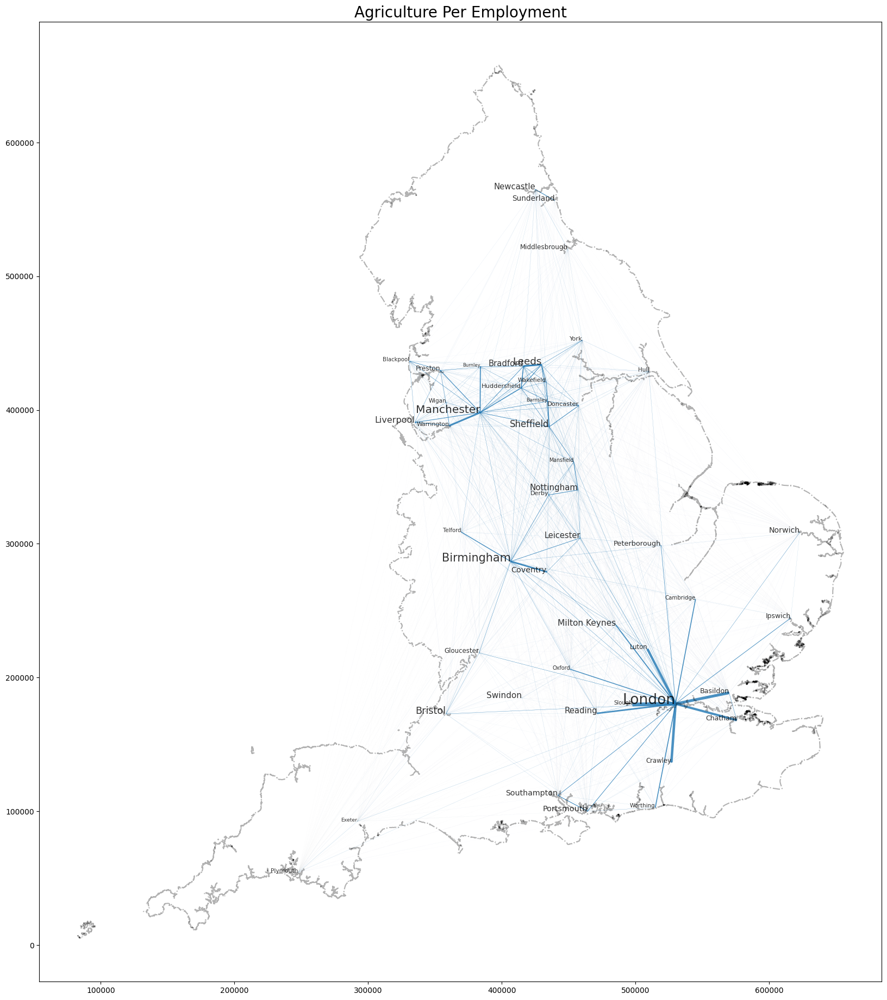

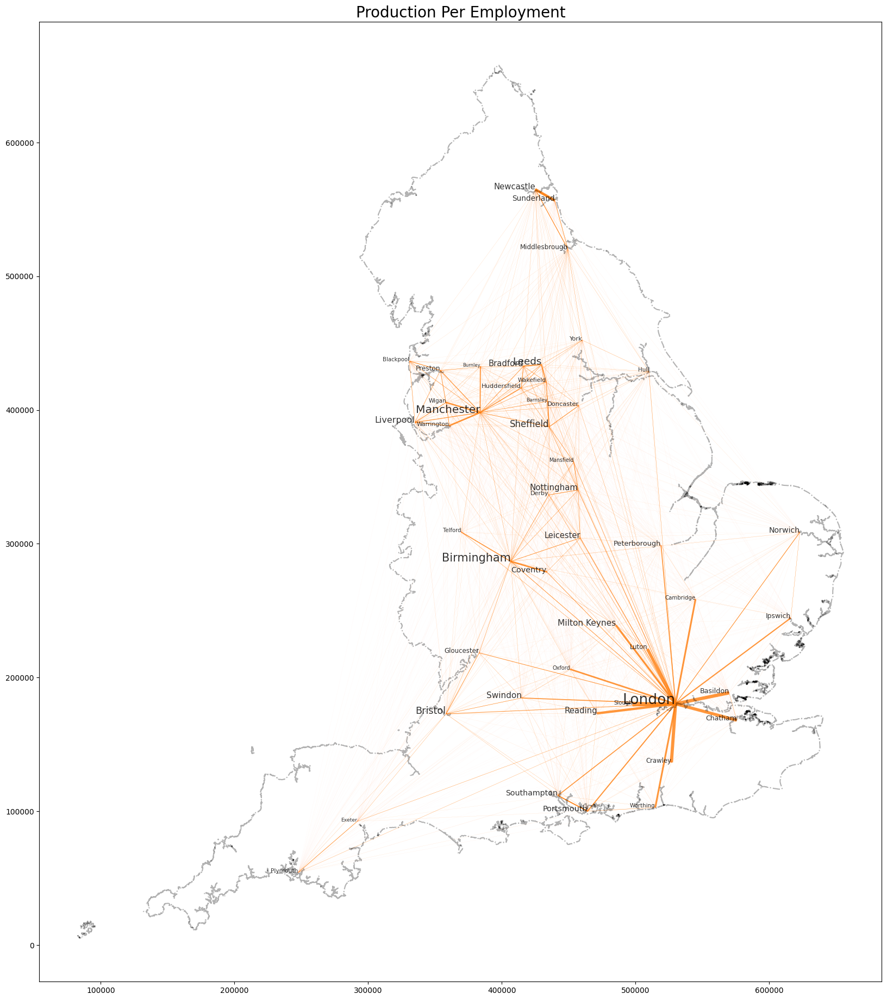

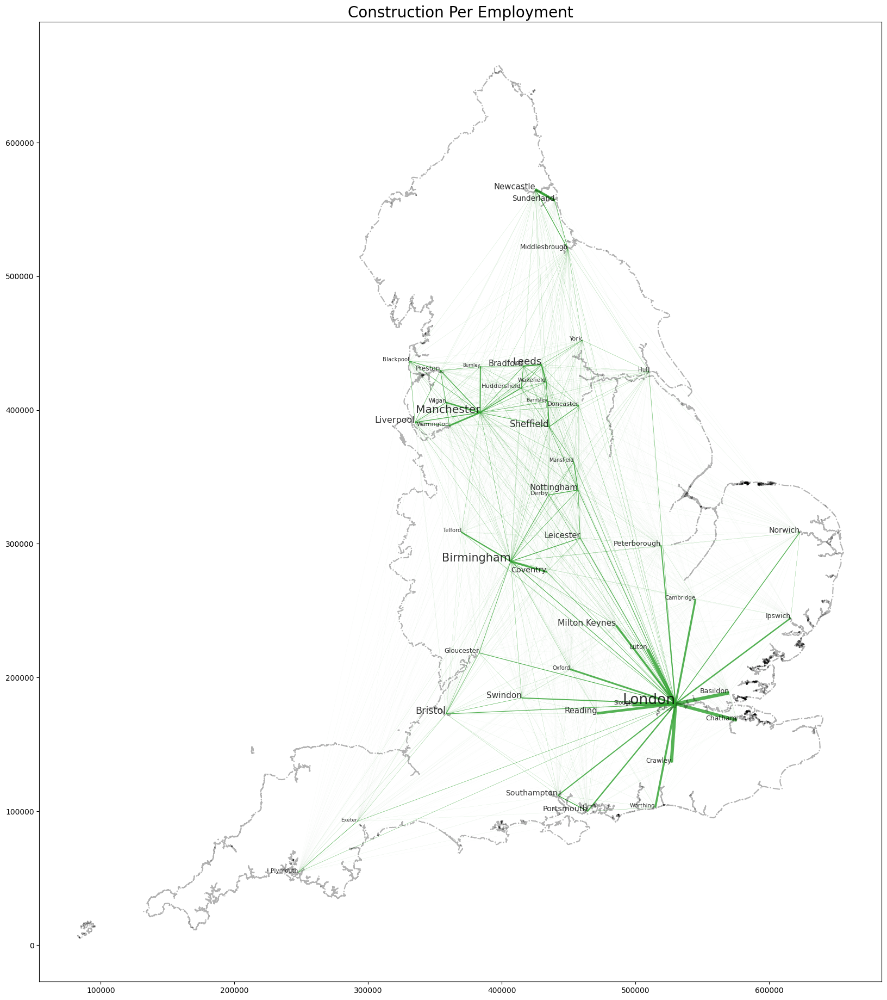

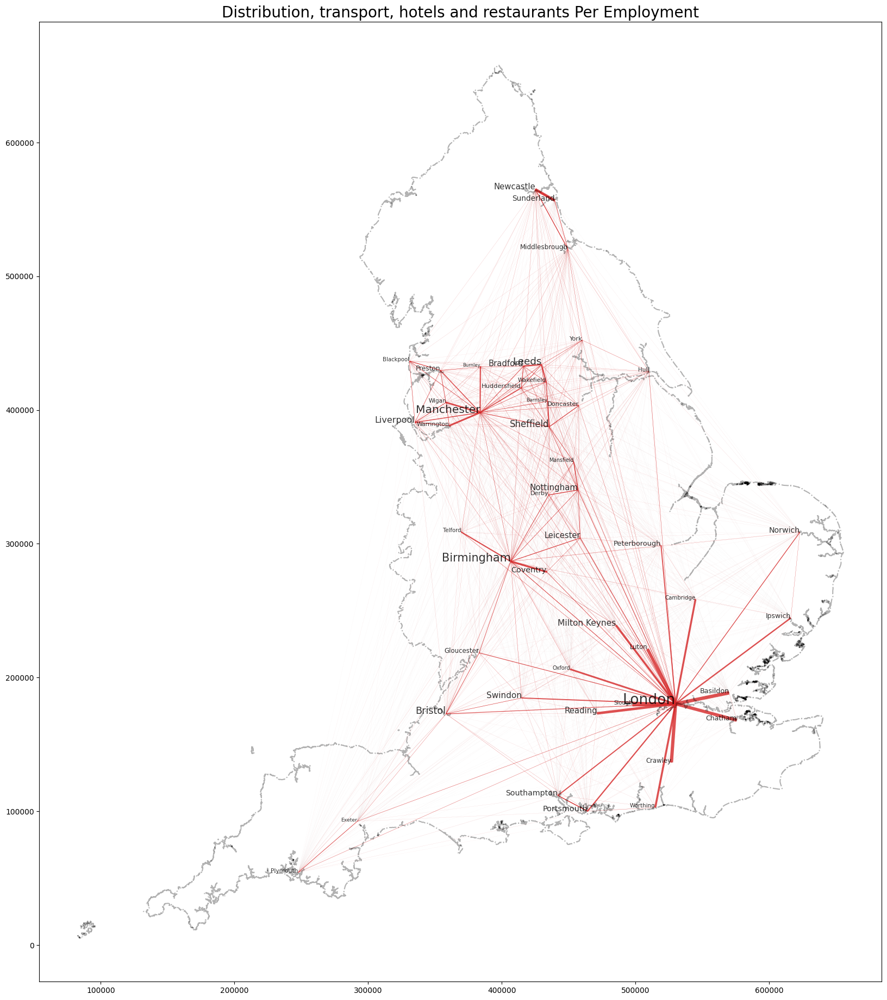

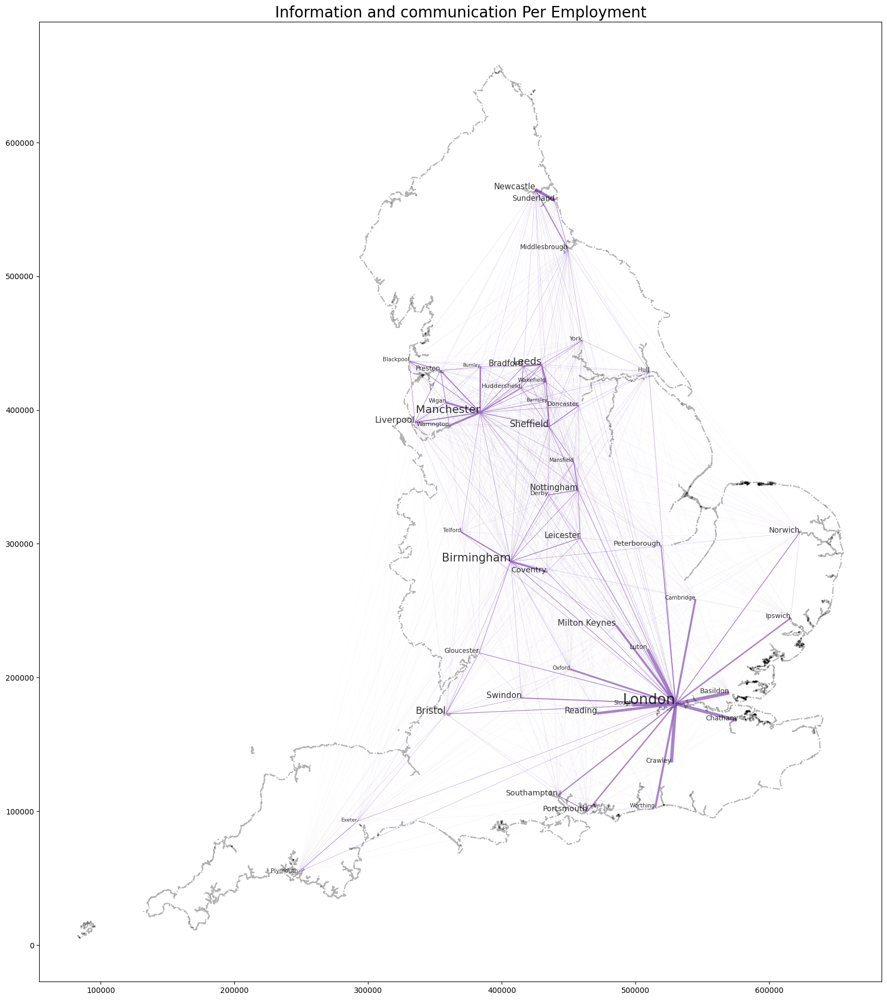

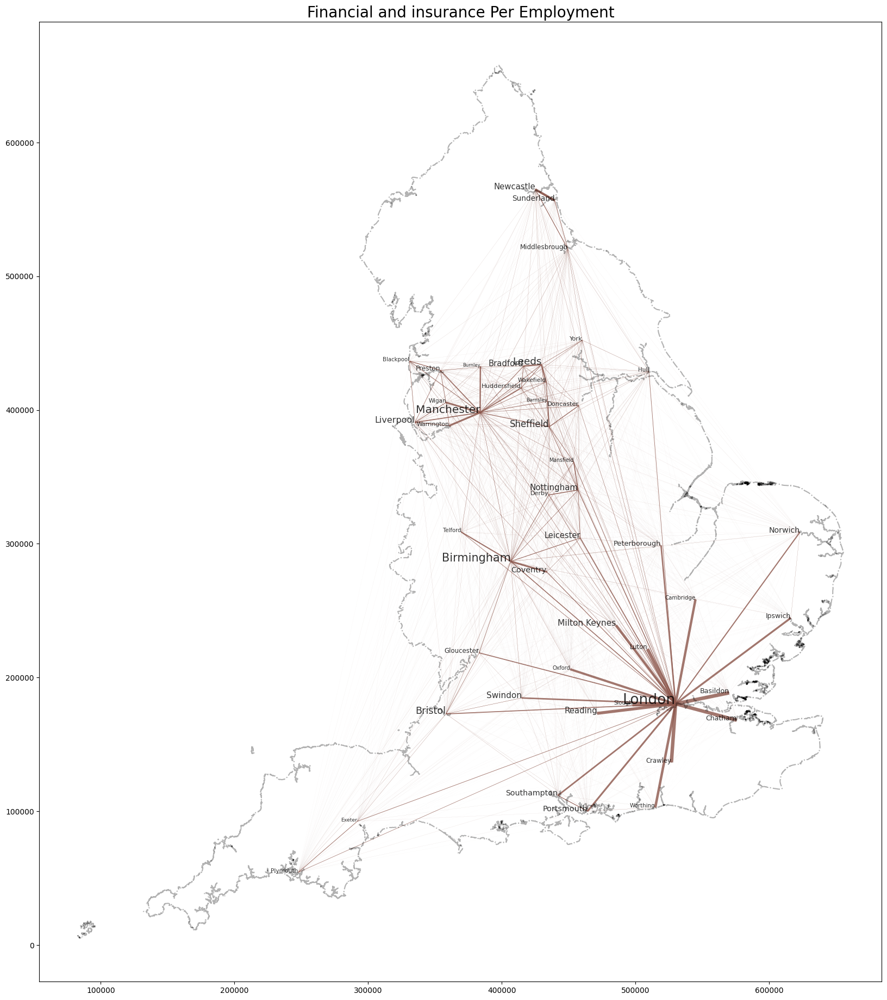

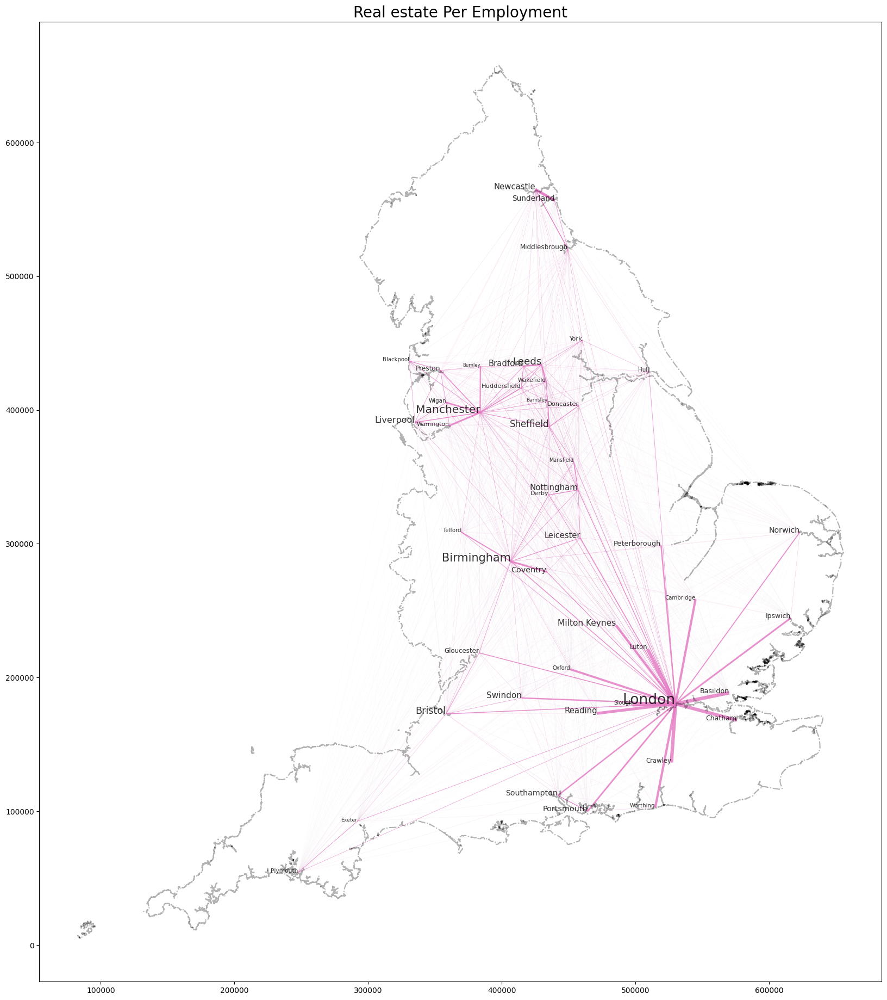

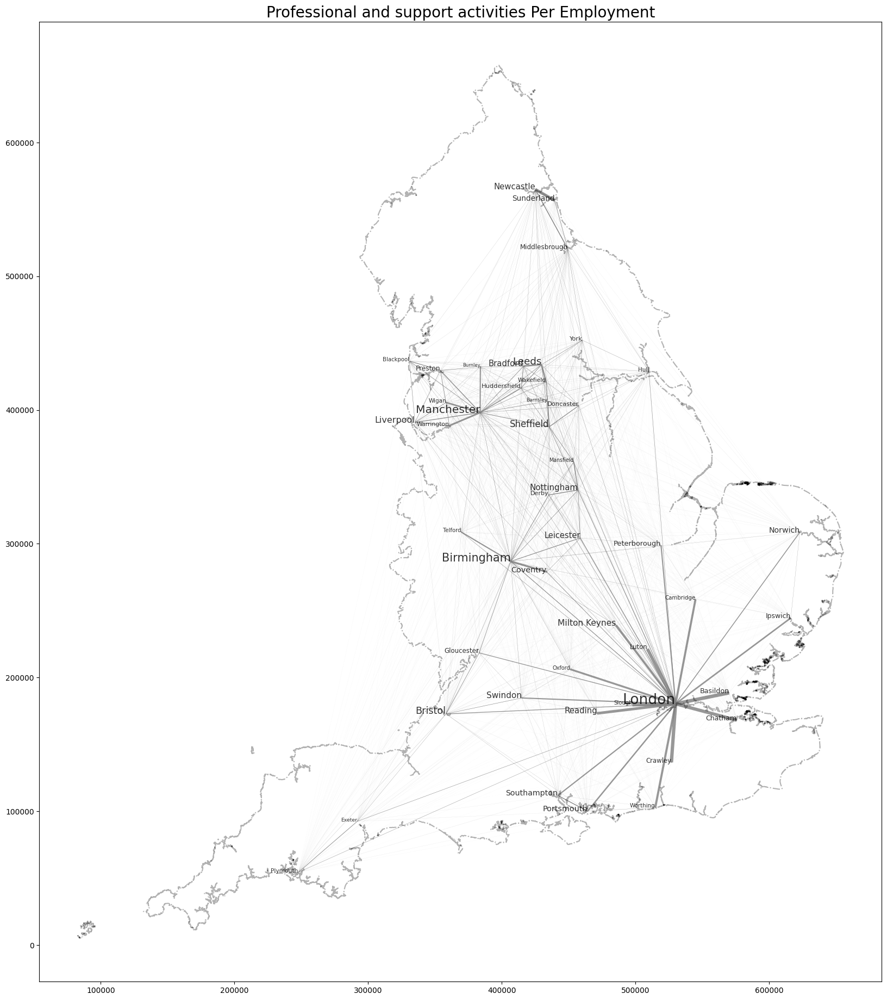

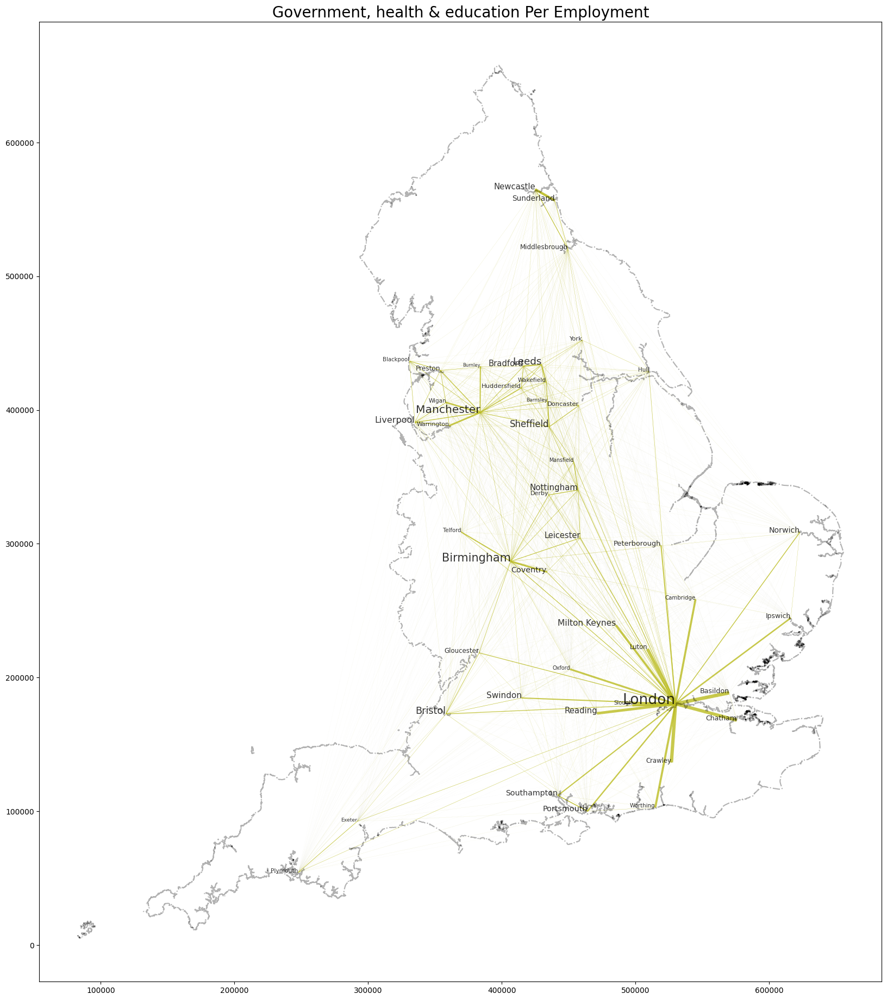

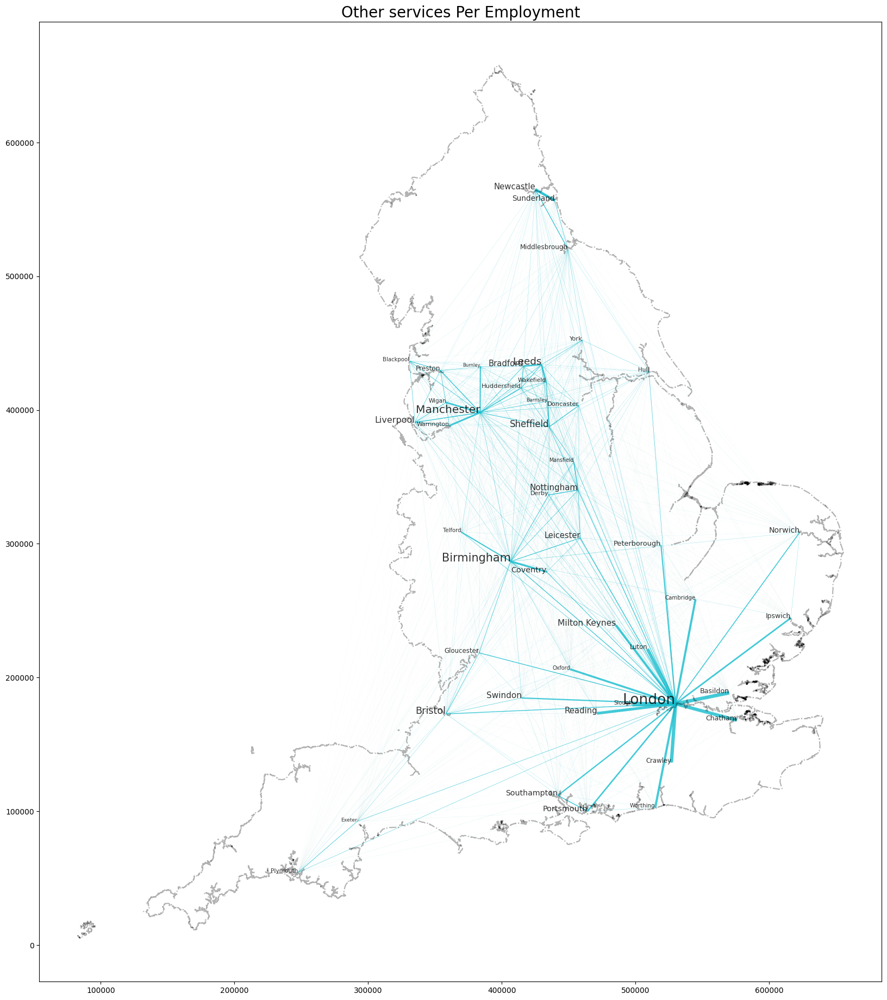

In [185]:
flow_plot_pe(vis_list_line,geolist_IO,color=list(mcolors.TABLEAU_COLORS),save=True)

Text(0.5, 1.0, 'Financial Flows')

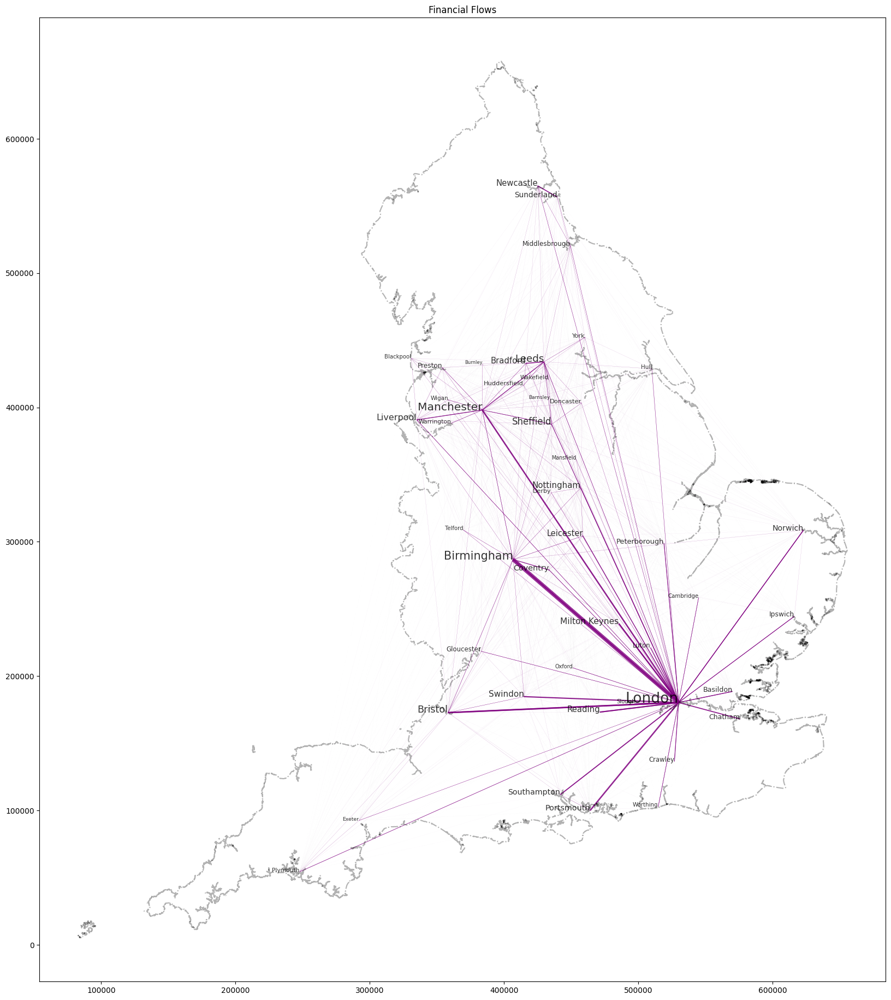

In [98]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig,ax = plt.subplots(figsize=(20,30)) 
divider = make_axes_locatable(ax)
Financial_flow.plot(linewidths=Financial_flow["Linewidth"],ax=ax,color="purple",alpha=0.8)
Markek_size=(Financial_flow.groupby("City")["Linewidth"].agg("sum"))+(Financial_flow.groupby("Other_City")["Linewidth"].agg("sum"))
Marker_size=(np.log(Markek_size/Markek_size.min())+2)*3
geolist_IO_temp=geolist_IO.join(Marker_size,on="NAME1")
boundary[boundary["CTRY22NM"]=='England'].boundary.plot(color="black",alpha=0.3,linestyle="-.",ax=ax)
geolist_IO_temp.apply(lambda x: ax.annotate(text=x['NAME1'], xy=x.geometry.coords[0], ha='right',size=x.Linewidth,alpha=0.8), axis=1)
plt.title("Financial Flows")


In [ ]:
def plot_indicator(indicator_list,geolist,year,save=False):
    geolist_IO=geolist[geolist["NAME1"].isin(list(indicator_list.index))]
    geolist_new=geolist_IO.join(indicator_list,on="NAME1")
    indicator_name=indicator_list.name
    fig,ax = plt.subplots(figsize=(20,30)) 
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    plt.title("City-level "+ "GDP(logged)" +" in " + str(year))
    geolist_new.plot(ax=ax,column=indicator_name, legend=True, cax=cax,markersize=((geolist_new[indicator_name]-23)*900),cmap='YlOrRd',alpha=0.7)
    boundary[boundary["CTRY22NM"]=='England'].boundary.plot(color="black",alpha=0.3,linestyle="-.",ax=ax)
    geolist_new.apply(lambda x: ax.annotate(text=x['NAME1'], xy=x.geometry.coords[0], ha='center',size=(x[indicator_name]-22)*3), axis=1)
    if save:
        plt.savefig("fig/"+str(year)+'.jpg')